# BUSINESS OBJECTIVES

In [1]:
## Predict the price of used bikes.

# DATA UNDERSTANDING

In [2]:
## Bike price depends on Km_driven,Make_year,Bike_name,Bike_model,Bike_address,State.But key performace factor for price predictions may be
##Km_driven,Make_year,Bike_model

In [3]:
## independent variables (Km_driven,Make_year,Bike_name,Bike_model,Bike_address,State)
## dependent variable(o\p)=Bike_price
##Bike_price: price of bike (in rupess)
##Km_driven: km drive by bike(in km)
##Make_year: manufacturing year
##Bike_name: bike company name
##Bike_model: model name of bike 
##City_name:  seller city location 
##State_name: seller state name

# DATA PREPARATION

# Clean data (Remove noise from data set)

In [1]:
## importing library 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
## Read the csv files and covert it to data frame by pandas
df=pd.read_csv('Avenger_Assemble.csv')

In [3]:
## Check the data set
df

,Unnamed: 0,bike_price,km_driven,make_year,bike_name,bike_model,bike_address,state
0,0,"₹ 45,000","34,361 km",2019.0,Bajaj,Pulsar,"Alapati Doctor Colony, Visakhapatnam, Andhra P...",AndhraPradesh
1,1,"₹ 2,00,000","9,000 km",2019.0,KTM,390 Duke ABS,"MVP Colony, Visakhapatnam, Andhra Pradesh",AndhraPradesh
2,2,"₹ 1,35,000","17,000 km",2019.0,KTM,Others,"NAD, Visakhapatnam, Andhra Pradesh",AndhraPradesh
3,3,"₹ 1,10,000","28,000 km",1992.0,Royal Enfield,Bullet,"Vajiapalem, Visakhapatnam, Andhra Pradesh",AndhraPradesh
4,4,"₹ 50,000","51,400 km",2015.0,Bajaj,Avenger,"Dasanna Pet, Vizianagaram, Andhra Pradesh",AndhraPradesh
...,...,...,...,...,...,...,...,...
9826,9826,"₹ 87,500","1,700 km",2019.0,TVS,Apache RTR,"Azadpur, Delhi, Delhi",Delhi
9827,9827,"₹ 40,000","55,000 km",2015.0,Suzuki,Gixxer,"Abul Fazal Enclave Part 1, Delhi, Delhi",Delhi
9828,9828,"₹ 80,000","25,000 km",2017.0,Yamaha,YZF R,"Ranhola, Delhi, Delhi",Delhi
9829,9829,"₹ 1,80,000","15,700 km",2019.0,Royal Enfield,Classic,"Mayur Vihar Phase 3, Delhi, Delhi",Delhi


In [7]:
# Inspecting the rows and number of columns of the dataset
df.shape

(9831, 8)

In [23]:
# Checking null values and data types of each columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9667 entries, 0 to 9830
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   bike_price  9667 non-null   float64
 1   km_driven   9667 non-null   float64
 2   make_year   9667 non-null   int32  
 3   bike_name   9667 non-null   object 
 4   bike_model  9667 non-null   object 
 5   city_name   9667 non-null   object 
 6   state_name  9667 non-null   object 
dtypes: float64(2), int32(1), object(4)
memory usage: 566.4+ KB


In [4]:
## Drop col which have no significant busines values 
df.drop((['Unnamed: 0']),axis=1,inplace=True)

In [10]:
##  Convert object data( bike_price,km_driven ) to numeric data

In [5]:
df['bike_price']=df['bike_price'].str.replace('[\₹\,]','',regex=True)
df['bike_price']=pd.to_numeric(df['bike_price'])

In [6]:
df['km_driven']=df['km_driven'].str.replace(',','').str.replace('km','')
df['km_driven']=pd.to_numeric(df['km_driven'])

In [7]:
##  from bike adress we need only city name and hence extract it by spliting method 
df[["location","city_name","state_name"]]=df["bike_address"].str.split(",",n=2,expand=True)

In [8]:
df

,bike_price,km_driven,make_year,bike_name,bike_model,bike_address,state,location,city_name,state_name
0,45000.0,34361.0,2019.0,Bajaj,Pulsar,"Alapati Doctor Colony, Visakhapatnam, Andhra P...",AndhraPradesh,Alapati Doctor Colony,Visakhapatnam,Andhra Pradesh
1,200000.0,9000.0,2019.0,KTM,390 Duke ABS,"MVP Colony, Visakhapatnam, Andhra Pradesh",AndhraPradesh,MVP Colony,Visakhapatnam,Andhra Pradesh
2,135000.0,17000.0,2019.0,KTM,Others,"NAD, Visakhapatnam, Andhra Pradesh",AndhraPradesh,NAD,Visakhapatnam,Andhra Pradesh
3,110000.0,28000.0,1992.0,Royal Enfield,Bullet,"Vajiapalem, Visakhapatnam, Andhra Pradesh",AndhraPradesh,Vajiapalem,Visakhapatnam,Andhra Pradesh
4,50000.0,51400.0,2015.0,Bajaj,Avenger,"Dasanna Pet, Vizianagaram, Andhra Pradesh",AndhraPradesh,Dasanna Pet,Vizianagaram,Andhra Pradesh
...,...,...,...,...,...,...,...,...,...,...
9826,87500.0,1700.0,2019.0,TVS,Apache RTR,"Azadpur, Delhi, Delhi",Delhi,Azadpur,Delhi,Delhi
9827,40000.0,55000.0,2015.0,Suzuki,Gixxer,"Abul Fazal Enclave Part 1, Delhi, Delhi",Delhi,Abul Fazal Enclave Part 1,Delhi,Delhi
9828,80000.0,25000.0,2017.0,Yamaha,YZF R,"Ranhola, Delhi, Delhi",Delhi,Ranhola,Delhi,Delhi
9829,180000.0,15700.0,2019.0,Royal Enfield,Classic,"Mayur Vihar Phase 3, Delhi, Delhi",Delhi,Mayur Vihar Phase 3,Delhi,Delhi


In [8]:
## drop col which have no significant busines values 
df.drop((['bike_address','state_name','location']),axis=1,inplace=True)

In [9]:
## change the column sequence 
title=list(df.columns )
title[5],title[6]=title[6],title[5]

In [10]:
df=df[title]
df

,bike_price,km_driven,make_year,bike_name,bike_model,city_name,state
0,45000.0,34361.0,2019.0,Bajaj,Pulsar,Visakhapatnam,AndhraPradesh
1,200000.0,9000.0,2019.0,KTM,390 Duke ABS,Visakhapatnam,AndhraPradesh
2,135000.0,17000.0,2019.0,KTM,Others,Visakhapatnam,AndhraPradesh
3,110000.0,28000.0,1992.0,Royal Enfield,Bullet,Visakhapatnam,AndhraPradesh
4,50000.0,51400.0,2015.0,Bajaj,Avenger,Vizianagaram,AndhraPradesh
...,...,...,...,...,...,...,...
9826,87500.0,1700.0,2019.0,TVS,Apache RTR,Delhi,Delhi
9827,40000.0,55000.0,2015.0,Suzuki,Gixxer,Delhi,Delhi
9828,80000.0,25000.0,2017.0,Yamaha,YZF R,Delhi,Delhi
9829,180000.0,15700.0,2019.0,Royal Enfield,Classic,Delhi,Delhi


In [11]:
## rename column
df.rename(columns={'state':'state_name'},inplace=True)

In [12]:
## check duplicates 
df.duplicated().sum()

140

In [13]:
## vizualize the duplicate value present in data
df.loc[df.duplicated(),:]

,bike_price,km_driven,make_year,bike_name,bike_model,city_name,state_name
16,110000.0,7000.0,2021.0,Bajaj,Pulsar,Chodavaram,AndhraPradesh
171,NaN,NaN,NaN,NaN,NaN,NaN,AndhraPradesh
300,85000.0,40000.0,2018.0,Bajaj,Pulsar,Srikakulam,AndhraPradesh
357,35000.0,45000.0,2016.0,TVS,Apache RTR,Nellore,AndhraPradesh
395,NaN,NaN,NaN,NaN,NaN,NaN,AndhraPradesh
...,...,...,...,...,...,...,...
9216,NaN,NaN,NaN,NaN,NaN,NaN,UttarPradesh
9282,NaN,NaN,NaN,NaN,NaN,NaN,UttarPradesh
9691,27500.0,21000.0,2012.0,TVS,Apache RTR,Delhi,Delhi
9746,60000.0,20000.0,2016.0,Honda,CB,Delhi,Delhi


In [13]:
## remove duplicates values to get better accuracy and  for genuinity of the data set
df=df.drop_duplicates()

In [14]:
df.duplicated().sum()

0

In [15]:
## check null values in data 
df.isnull().sum()

bike_price    21
km_driven     20
make_year     24
bike_name     24
bike_model    24
city_name     21
state_name     0
dtype: int64

In [16]:
## Check the percentage of the missing values
df.isnull().sum()/(len(df))*100

bike_price    0.216696
km_driven     0.206377
make_year     0.247652
bike_name     0.247652
bike_model    0.247652
city_name     0.216696
state_name    0.000000
dtype: float64

In [17]:
## as percentage of missing values are very small we can drop them
df.dropna(how="any",inplace=True)

In [19]:
## confirming no missing values in data 
df.isnull().sum()

bike_price    0
km_driven     0
make_year     0
bike_name     0
bike_model    0
city_name     0
state_name    0
dtype: int64

In [20]:
df.shape

(9667, 7)

In [18]:
## convert make year to int value
df['make_year'] = df['make_year'].astype(int)

In [20]:
for i in df:
    print(i,df[i].unique(),'\n\n')

bike_price [  45000.  200000.  135000.  110000.   50000.   85000.   55000.  126000.
  300000.   72000.  160000.   70000.   80000.  165000. 1450000.   76000.
  101000.   27000.   35000.   40000.   32000.   89000.   25000.   46000.
   90000.   38000.   29500.  150000. 1000000.  130000.   44000.  100500.
  190000.   22000.  113000.   65000.   19500.  170000.   69999.   82500.
   60000.   28000.   82000.   30000.   75000.   68000.   26000.  175000.
   37000.  210000.  120000.   54000.  290000.  138000.   14500.   14000.
  136000.  230000.  115000.   33000.   19000.   42000.  100000.   52000.
  125000.   47000.  195000.   78000.   13000.   24500.   43000.  220000.
  375000.   95000.   23000.   24000.   45999.  145000.   20000.   49999.
   15000.   21000.   36000.   18000.   58000.   41000.  155000.    8000.
  240000.   49000.  180000.  132000.   38500.   62000. 1500000.  185000.
  310000.   66000.  265000.   63000.   34999.   29999.  184000.   96000.
   31000.   65500.   16000.  140000.    

# Exploratory data analysis
##In this step we are going to discover pattens and to check assumptions with the help of visualization

# Univariate Analysis
##Our main motive through this step is to derive the data, define and summarize it, and analyze the pattern present in it. In a dataset, it explores each variable separately.

In [29]:
## MEASURE OF Central Tendency (1st business moment  Decision)
a=df.mean()
b=df.mode()
c=df.median()
a,b,c

(bike_price    80730.266991
 km_driven     29765.371367
 make_year      2014.757422
 dtype: float64,
    bike_price  km_driven  make_year bike_name bike_model city_name  state_name
 0     35000.0    30000.0     2018.0     Bajaj     Others     Delhi  chandigarh,
 bike_price    58000.0
 km_driven     23000.0
 make_year      2016.0
 dtype: float64)

In [30]:
##Measure of Dispersion (2nd Business Moments Decision)
d=df.var()
e=df.std()
d,e

(bike_price    9.106233e+09
 km_driven     2.222111e+09
 make_year     3.716410e+01
 dtype: float64,
 bike_price    95426.584769
 km_driven     47139.270685
 make_year         6.096236
 dtype: float64)

In [31]:

x=df['bike_price'].max()
y=df['bike_price'].min()

x,y

(1850000.0, 5000.0)

In [32]:
a=df['km_driven'].max()
b=df['km_driven'].min()
a,b

(986574.0, 0.0)

In [33]:
c=df['make_year'].max()
d=df['make_year'].min()
c,d

(2022.0, 1900.0)

In [34]:
Range = max(df['bike_price'])-min(df['bike_price'])
Range

1845000.0

In [35]:
Range = max(df['km_driven'])-min(df['km_driven'])
Range

986574.0

In [36]:
Range = max(df['make_year'])-min(df['make_year'])
Range

122.0

# Vizualiation of numeric data

In [37]:
# Extracting names of numerical columns from the data
numeric_features = df.describe().columns
numeric_features

Index(['bike_price', 'km_driven', 'make_year'], dtype='object')

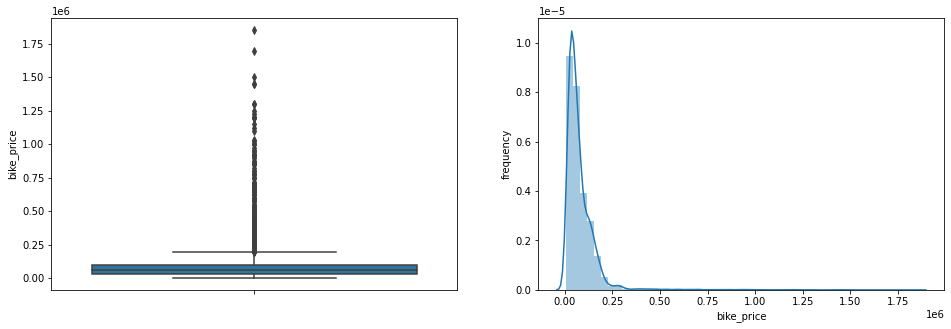

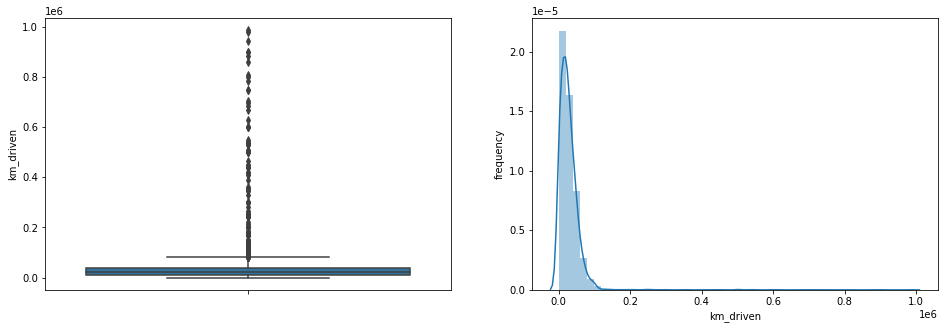

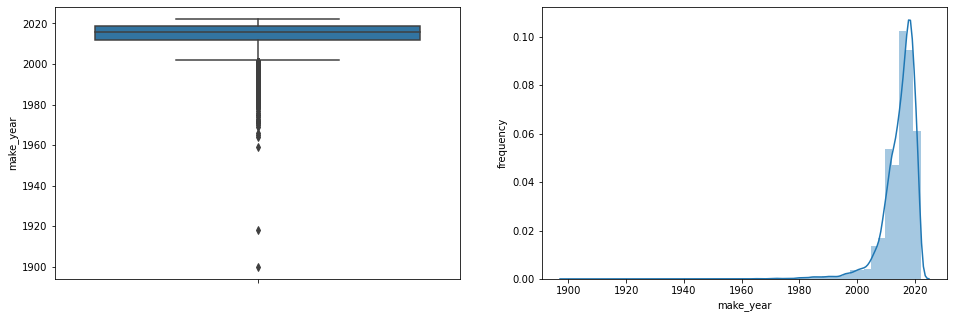

In [38]:
# Distplot and box plot of numeric features

for var in numeric_features:
    plt.figure(figsize=(16,5))
    plt.subplot(1, 2, 1)
    fig = sns.boxplot(y=df[var])
    fig.set_title('')
    fig.set_ylabel(var)
    
# Distplot  
    plt.subplot(1, 2, 2)
    fig = sns.distplot(df[var].dropna())
    fig.set_ylabel('frequency')
    fig.set_xlabel(var)

    plt.show()

In [39]:
##The distribution of bike_price and km_driven are highly right skewed. make_year is severely left skewed

# Categorical Analysis

In [40]:
## know the frequency of each bike name prsesent in the olx site 
freq = pd.crosstab(index=df['bike_name'],  # Make a crosstab
                        columns="count") 
freq

col_0,count
bike_name,
Bajaj,2458
Hero,1267
Hero Honda,638
Honda,801
KTM,388
Other Brands,467
Royal Enfield,1525
Suzuki,224
TVS,801


In [41]:
## perecntage of each bike compare to total bike
freq/freq.sum()

col_0,count
bike_name,
Bajaj,0.254267
Hero,0.131064
Hero Honda,0.065998
Honda,0.082859
KTM,0.040137
Other Brands,0.048309
Royal Enfield,0.157753
Suzuki,0.023172
TVS,0.082859


In [42]:
## know the model name of bikes present in  the olx site 
freq = pd.crosstab(index=df['bike_model'],  # Make a crosstab
                        columns="count") 
freq

col_0,count
bike_model,
390 Duke ABS,47
Access,1
Achiever,16
Ambition,8
Apache RTR,518
Avenger,273
Bandit,1
Bullet,506
CB,306


In [43]:
## perecntage of each bike compare to total bike
freq/freq.sum()

col_0,count
bike_model,
390 Duke ABS,0.004862
Access,0.000103
Achiever,0.001655
Ambition,0.000828
Apache RTR,0.053584
Avenger,0.028240
Bandit,0.000103
Bullet,0.052343
CB,0.031654


In [44]:
## know the city where olx bikes are available  
freq = pd.crosstab(index=df['city_name'],  # Make a crosstab
                        columns="count") 
freq

col_0,count
city_name,
A Vellalapatti,1
AEC Complex,1
Abhayapuri,1
Abohar,3
Abu Road,1
...,...
Yellareddy,1
Yemmiganur,2
Yenugonda,1


In [45]:
## perecntage of each bike compare to total bike
freq/freq.sum()

col_0,count
city_name,
A Vellalapatti,0.000103
AEC Complex,0.000103
Abhayapuri,0.000103
Abohar,0.000310
Abu Road,0.000103
...,...
Yellareddy,0.000103
Yemmiganur,0.000207
Yenugonda,0.000103


In [46]:
##state names where bikes are present in the olx site 
freq = pd.crosstab(index=df['state_name'],  # Make a crosstab
                        columns="count") 
freq

col_0,count
state_name,
AndhraPradesh,486
Assam,484
Bihar,317
Delhi,503
Gujarat,477
Haryana,495
Jharkhand,494
Karnataka,485
Kerala,476


In [47]:
## perecntage 
freq/freq.sum()

col_0,count
state_name,
AndhraPradesh,0.050274
Assam,0.050067
Bihar,0.032792
Delhi,0.052033
Gujarat,0.049343
Haryana,0.051205
Jharkhand,0.051102
Karnataka,0.050171
Kerala,0.049240


# VIZUALTION ON CATEGORICAL COLUMN

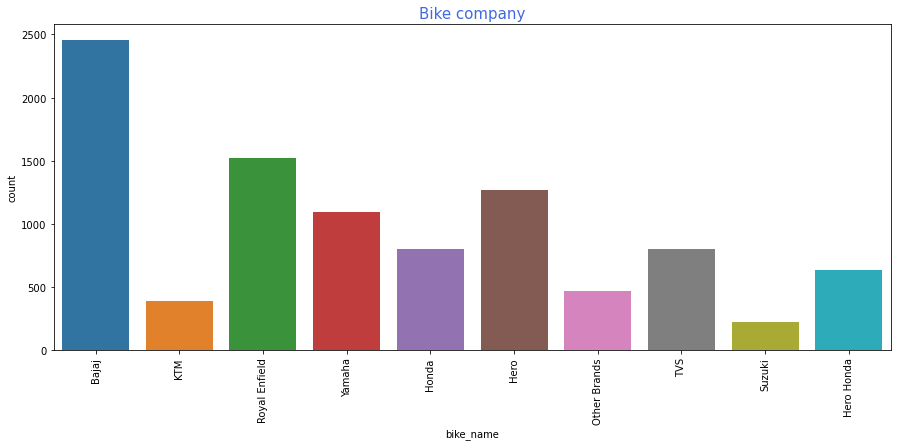

In [48]:
plt.figure(figsize=(15,6))
plt.xticks(rotation =90)
sns.countplot(x='bike_name',data=df)
plt.title("Bike company",size = 15, color = 'royalblue')
plt.show()

In [49]:
## MAXIMUM bajaj company's  bikes are present in the site and minimum suzuki company's bikes are present in the site

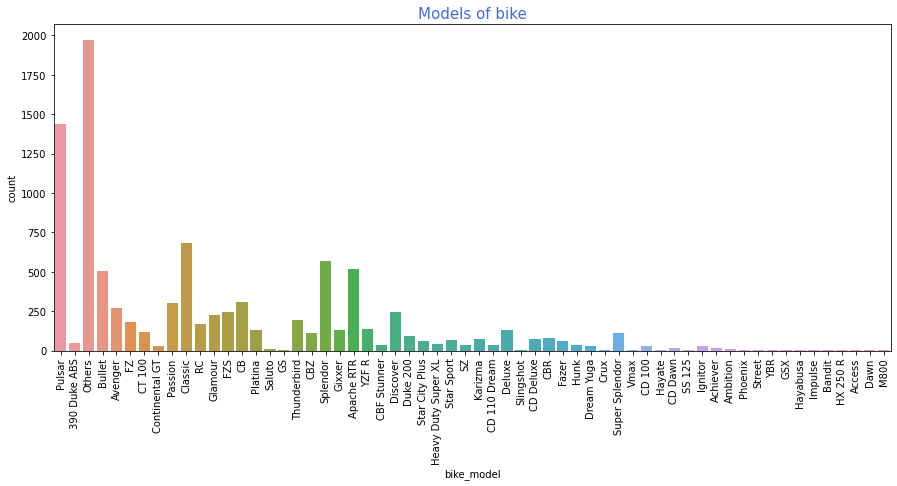

In [50]:
plt.figure(figsize=(15,6))
plt.xticks(rotation =90)
sns.countplot(x='bike_model',data=df)
plt.title("Models of bike",size = 15, color = 'royalblue')
plt.show()

In [51]:
## most of the seller don't maintion their bike model name in the site 
##M800, Bandit  ,Access, Vmax, HX 250 R(least number of bikes model)  

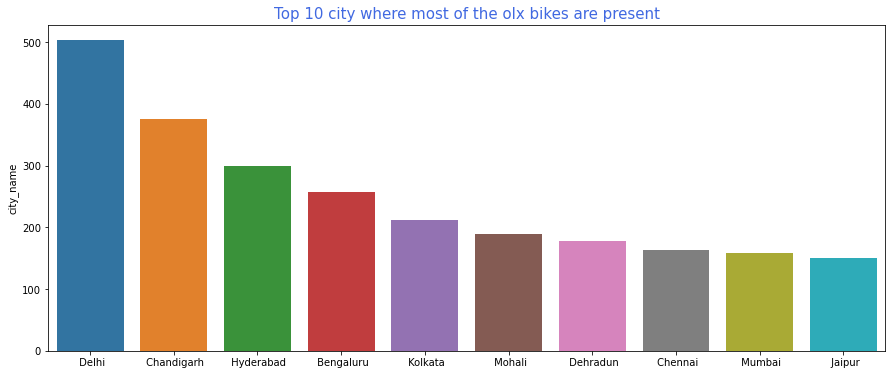

In [52]:
plt.figure(figsize=(15,6))
sns.barplot(df['city_name'].value_counts()[:10].keys(),df['city_name'].value_counts()[:10])
plt.title("Top 10 city where most of the olx bikes are present",size = 15, color = 'royalblue')
plt.show()

In [53]:
## in Delhi most of the bikes are present for sale

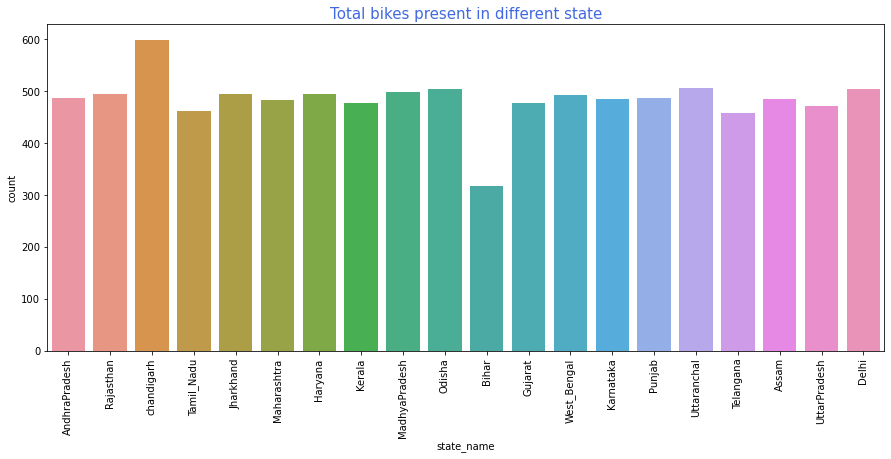

In [54]:
plt.figure(figsize=(15,6))
plt.xticks(rotation =90)
sns.countplot(x='state_name',data=df)
plt.title("Total bikes present in different state",size = 15, color = 'royalblue')
plt.show()

In [55]:
##chandigarh  has maximum number of bikes, Bihar has min number of bikes

In [56]:
# Bivariate analysis(Check the relation )

In [57]:
## check the relation between bike_price,km_driven

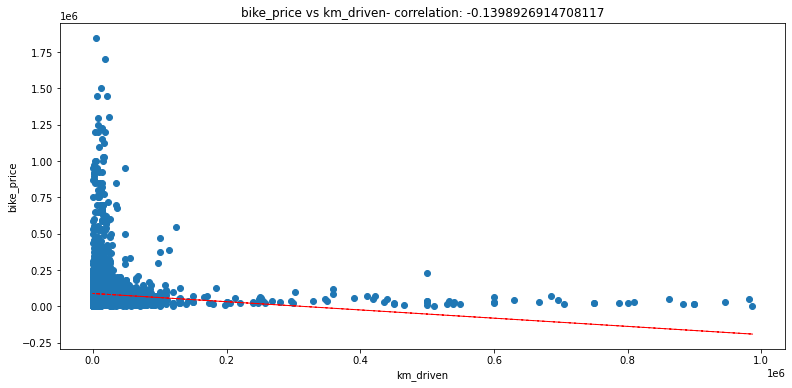

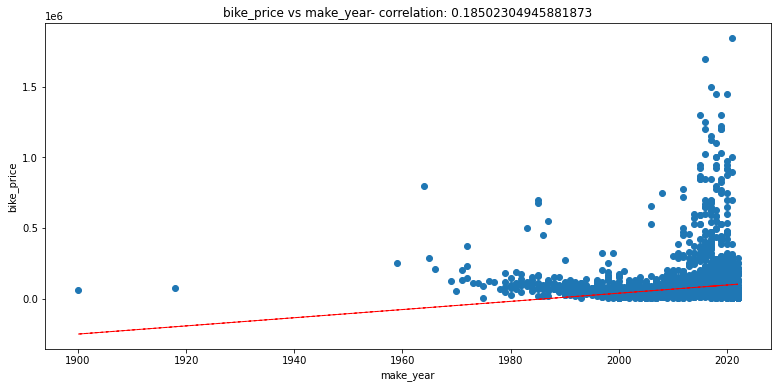

In [58]:
# Relation of numeric features with Rented Bike Count
for col in numeric_features[1:]:
    fig = plt.figure(figsize=(13, 6))
    ax = fig.gca()
    feature = df[col]
    label = df['bike_price']
    correlation = feature.corr(label)
    plt.scatter(x=feature, y=label)
    plt.xlabel(col)
    plt.ylabel('bike_price')
    ax.set_title('bike_price vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df[col], df['bike_price'], 1)
    y_hat = np.poly1d(z)(df[col])

    plt.plot(df[col], y_hat, "r--", lw=1)

plt.show()

In [59]:
## from the graph and correlation coeficient values it's  clearly seen that price of the bikes has negative relation with km driven by the bike and hence our assumption seems to be true i.e if km driven is more means bike is old and price of the bike must be low what we observe in our day to life.

In [60]:
## price of bike which is manufacturered in recent year is more and least price is manufactured in the year 1970

In [61]:
df['km_driven'].value_counts()
## our objective is to predict used bikes and those bike whose km_driven is equal to zero or less than 50 seems frod or noise in our data and hence we can remove them

30000.0     333
40000.0     298
50000.0     294
25000.0     288
20000.0     257
           ... 
185000.0      1
26857.0       1
32897.0       1
57141.0       1
29413.0       1
Name: km_driven, Length: 1992, dtype: int64

In [19]:
df[df["km_driven"]<10]

,bike_price,km_driven,make_year,bike_name,bike_model,city_name,state_name
105,24500.0,0.0,2010,TVS,Star City Plus,Eluru,AndhraPradesh
168,30000.0,0.0,2014,Bajaj,Pulsar,Visakhapatnam,AndhraPradesh
217,66000.0,0.0,1998,Yamaha,FZ,Kadapa,AndhraPradesh
290,32000.0,0.0,2010,Hero Honda,CBZ,Pithapuram,AndhraPradesh
338,16000.0,0.0,2002,Hero Honda,Passion,Dowleswaram,AndhraPradesh
...,...,...,...,...,...,...,...
9456,9999.0,0.0,2011,Bajaj,Pulsar,Delhi,Delhi
9546,5000.0,1.0,2021,Other Brands,Others,Delhi,Delhi
9758,25000.0,0.0,2021,Other Brands,Others,Delhi,Delhi
9800,22000.0,0.0,2014,Bajaj,Pulsar,Delhi,Delhi


In [63]:
## their are 240 rows who's km driven less than 0 or 1 and price are too less for them also make are not so old and hence replace them with mean or median values
## but km drivenhas high mean values  if we replace them with mean then out accuracy effects more and hence
## replace them with median values

In [20]:
df["km_driven"]=df["km_driven"].replace(0,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(1,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(2,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(3,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(4,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(5,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(6,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(7,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(8,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(9,df["km_driven"].median())
df["km_driven"]=df["km_driven"].replace(0,df["km_driven"].median())

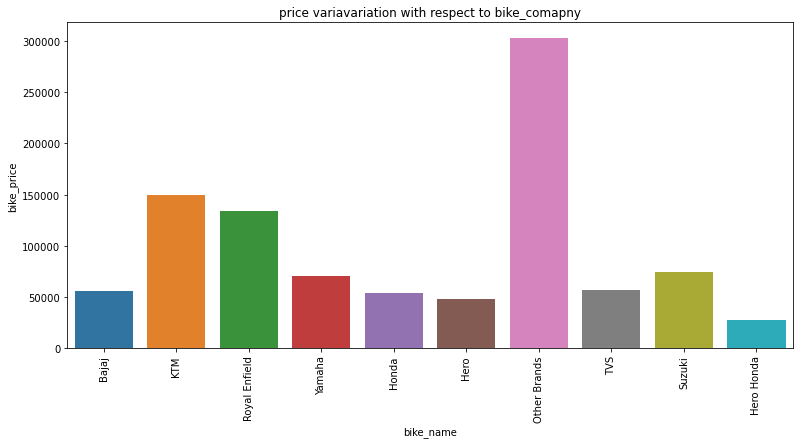

In [71]:
plt.figure (figsize=(13,6))
plt.xticks(rotation=90)
sns.barplot(x="bike_name",y="bike_price",data=df,ci=None)
plt.title("price variavariation with respect to bike_comapny")
plt.show()

In [72]:
# Bike price of hero honda is less and other brands bike have more price

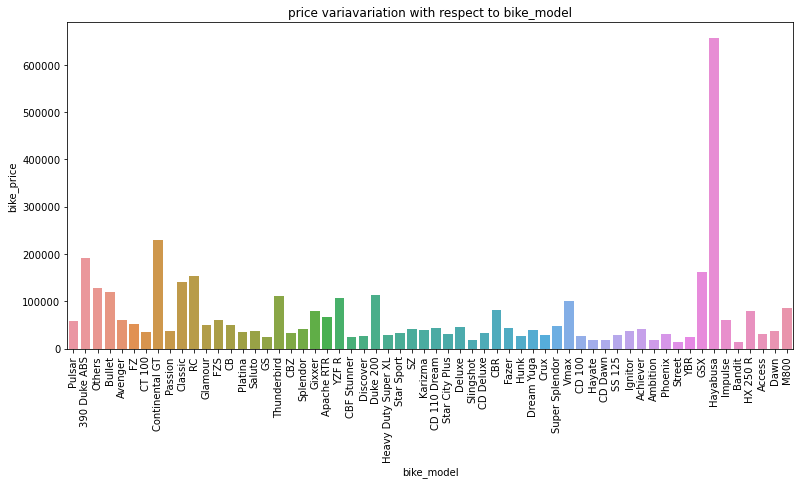

In [73]:
plt.figure (figsize=(13,6))
plt.xticks(rotation=90)
sns.barplot(x="bike_model",y="bike_price",data=df,ci=None)
plt.title("price variavariation with respect to bike_model")
plt.show()

In [74]:
# bike model of Hayabusa has heigh selling price  and Bandit has least elling price

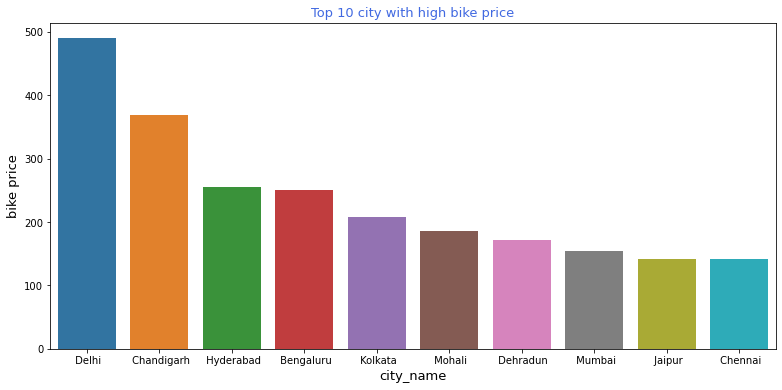

In [75]:
plt.figure (figsize=(13,6))
sns.barplot(df['city_name'].value_counts()[:10].keys(),df['city_name'].value_counts()[:10])
plt.xlabel("city_name",size = 13)
plt.ylabel("bike price",size = 13)
plt.title("Top 10 city with high bike price",size = 13, color = 'royalblue')
plt.show()

# OUTLIER DETECTION AND TREATMENT

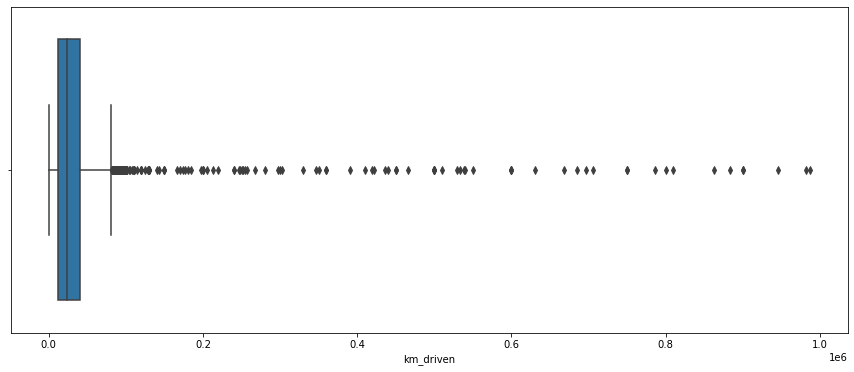

In [76]:
fig,ax=plt.subplots(figsize=(15,6))
sns.boxplot(df["km_driven"],ax=ax)
plt.show()

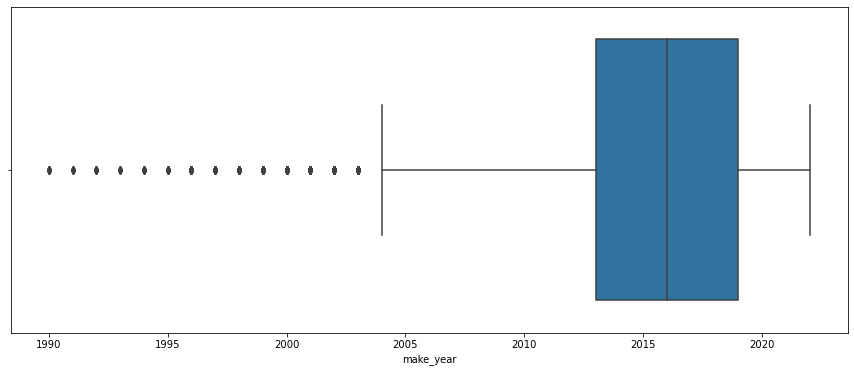

In [77]:
fig,ax=plt.subplots(figsize=(15,6))
sns.boxplot(df["make_year"],ax=ax)
plt.show()

# HYPOTHESIS TESTING

In [79]:
## HO=CITY DECIDE BIKE PRICE
## HA= CITY DOES NOT DECIDE BIKE PRICE

In [80]:
## to do hypothesis testing lets separate column and make different data set

In [81]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [82]:
model=ols('bike_price~city_name',data=df).fit()

In [83]:
aov=sm.stats.anova_lm(model,type=2)

In [84]:
print(aov)

               df        sum_sq       mean_sq         F  PR(>F)
city_name  1741.0  1.136046e+13  6.525248e+09  0.670583     1.0
Residual   7444.0  7.243535e+13  9.730702e+09       NaN     NaN


In [85]:
## as p value is more we have to accept null hypothesis.

# DATA PREPROCESSING(Converting categorical to numeric)

In [21]:
### Creating a copy so that we can make changes in the data during encoding.
df_final = df.copy()

In [26]:
## converting categorical to numeric

In [22]:
df_final=pd.get_dummies(df_final,columns =['bike_name'])

In [23]:
df_final=pd.get_dummies(df_final,columns =['bike_model'])

In [24]:
df_final=pd.get_dummies(df_final,columns =['city_name'])

In [25]:
df_final=pd.get_dummies(df_final,columns =['state_name'])

In [35]:
df_final

,bike_price,km_driven,make_year,bike_name_Bajaj,bike_name_Hero,bike_name_Hero Honda,bike_name_Honda,bike_name_KTM,bike_name_Other Brands,bike_name_Royal Enfield,...,state_name_Maharashtra,state_name_Odisha,state_name_Punjab,state_name_Rajasthan,state_name_Tamil_Nadu,state_name_Telangana,state_name_UttarPradesh,state_name_Uttaranchal,state_name_West_Bengal,state_name_chandigarh
0,45000.0,34361.0,2019,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,200000.0,9000.0,2019,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,135000.0,17000.0,2019,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,110000.0,28000.0,1992,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,50000.0,51400.0,2015,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9826,87500.0,1700.0,2019,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9827,40000.0,55000.0,2015,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9828,80000.0,25000.0,2017,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9829,180000.0,15700.0,2019,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


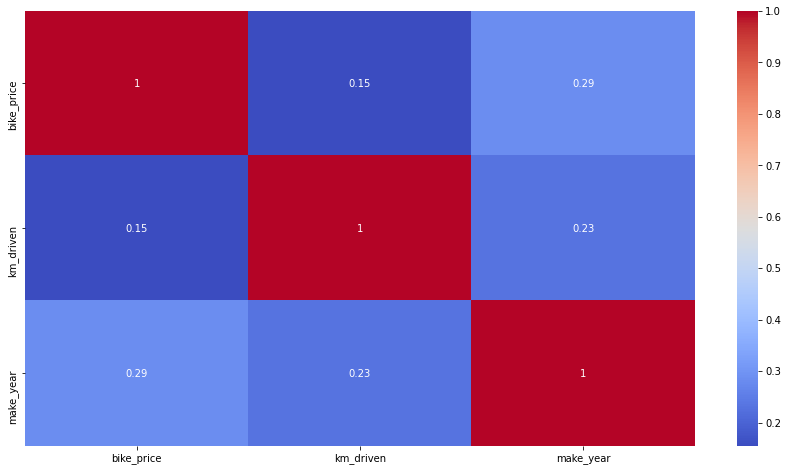

In [93]:
## Correlation matrix
plt.figure(figsize=(15,8))
correlation = df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')
plt.show()

In [94]:
# Checking Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

  # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [95]:
calc_vif(df[[i for i in df.describe().columns if i not in ['bike_price']]])

,variables,VIF
0,km_driven,1.424546
1,make_year,1.424546


In [96]:
## no colinearity present in between independent variables

# MODEL BUILDING 

## Data partition

In [26]:

from sklearn.model_selection import train_test_split


In [27]:
Y= df_final.bike_price

In [33]:
Y.shape

(9667,)

In [28]:
X=df_final.drop('bike_price',axis=1)

In [40]:
X

,km_driven,make_year,bike_name_Bajaj,bike_name_Hero,bike_name_Hero Honda,bike_name_Honda,bike_name_KTM,bike_name_Other Brands,bike_name_Royal Enfield,bike_name_Suzuki,...,state_name_Maharashtra,state_name_Odisha,state_name_Punjab,state_name_Rajasthan,state_name_Tamil_Nadu,state_name_Telangana,state_name_UttarPradesh,state_name_Uttaranchal,state_name_West_Bengal,state_name_chandigarh
0,34361.0,2019,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9000.0,2019,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,17000.0,2019,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,28000.0,1992,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,51400.0,2015,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9826,1700.0,2019,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9827,55000.0,2015,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9828,25000.0,2017,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9829,15700.0,2019,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


# Spliting data into train and test

In [29]:
from sklearn.model_selection import train_test_split

In [30]:
#Splitting the data into two parts where the test data contains 30% of orignal data and train data contain 70% of original data
X_train, X_test, Y_train, Y_test = train_test_split( X,Y , test_size = 0.2, random_state = 0) 

In [31]:
X_train.shape

(7733, 1903)

In [32]:
X_test.shape

(1934, 1903)

# 1.LINEAR REGRESSION

In [59]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error


# Model fitting

In [40]:
# Creating an instance for linear regression 
reg = LinearRegression()
# Model fitting
reg.fit(X_train, Y_train)

LinearRegression()

# Predict model

In [41]:
# Prediction
y_train_pred = reg.predict(X_train)
y_test_pred = reg.predict(X_test)

# Model evaluation

In [38]:
train_score =reg.score(X_train,Y_train)
test_score=reg.score(X_test,Y_test)
print(train_score,test_score)

0.4206939091750169 0.3503666259343471


In [39]:
r2_train=r2_score(Y_train,y_train_pred)
r2_test=r2_score(Y_test,y_test_pred)
r2_train,r2_test

(0.4206939091750169, 0.3503666259343471)

In [40]:
MSE_train=mean_squared_error(Y_train,y_train_pred)
MSE_test=mean_squared_error(Y_test,y_test_pred)
MSE_train,MSE_test

(5411465320.193489, 5301981598.131701)

In [41]:
print('Root Mean Squared Error_train:', np.sqrt(metrics.mean_squared_error(Y_train, y_train_pred)))

Root Mean Squared Error_train: 73562.6625414924


In [42]:
print('Root Mean Squared Error_test:', np.sqrt(metrics.mean_squared_error(Y_test, y_test_pred)))

Root Mean Squared Error_test: 72814.70729276951


In [43]:
print('Accuracy',100-(np.mean(np.abs((Y_test-y_test_pred)/Y_test))*100))

Accuracy 17.69424610741389


# creating the bar plot of feature importance¶


In [42]:
np.set_printoptions(suppress=True)

In [43]:
coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(reg.coef_))], axis = 1)

In [44]:
coef = coefficients.iloc[:,0]
value = coefficients.iloc[:,1]

In [45]:
fig_dims = (200,80)
fig = plt.subplots(figsize=fig_dims) 
plt.barh(coef, value, color ='maroon') 
plt.show()

In [ ]:
## we can't  see clear graph but their is so many coloumn which have -ve impact on dependent variables.

# Result

In [ ]:
## r2 score of train =0.42  ,test=0.35  , RMSE score =73562.6625414924(train) ,72814.70729276951(test),accuracy = 17.69%

# 2.Decision Tree

In [46]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Model fitting

In [47]:
# Creating an instance for decision tree regressor
dt_model = DecisionTreeRegressor()

In [48]:
# Defining parameter list to perform GridSearchCV
param_dict = {"criterion": ["mse", "mae"],
              "min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100],
              }
# GridSearchCV
dt_grid = GridSearchCV(estimator=dt_model,param_grid = param_dict, cv=5)

dt_grid.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 6, 8],
                         'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [20, 40, 100],
                         'min_samples_split': [10, 20, 40]})

In [49]:
# Getting best estimator from GridSearch
dt_grid.best_estimator_

DecisionTreeRegressor(max_depth=6, max_leaf_nodes=100, min_samples_leaf=20,
                      min_samples_split=10)

# Model prediction

In [50]:
# Making predictions on train and test data

dt_train_preds = dt_grid.predict(X_train)
dt_test_preds = dt_grid.predict(X_test)

# Evaluate  model

In [52]:
train_score =reg.score(X_train,Y_train)
test_score=reg.score(X_test,Y_test)
print(train_score,test_score)

0.4206939091750169 0.3503666259343471


In [51]:
r2_score_dt_train=r2_score(Y_train,dt_train_preds)
r2_score_dt_test=r2_score(Y_test,dt_test_preds)
r2_score_dt_train,r2_score_dt_test

(0.5036465475092049, 0.4407531577558381)

In [54]:
MSE_train=mean_squared_error(Y_train,dt_train_preds)
MSE_test=mean_squared_error(Y_test,dt_test_preds)
MSE_train,MSE_test

(4636580794.251867, 4564292083.448518)

In [57]:
print('Root Mean Squared Error_train:', np.sqrt(metrics.mean_squared_error(Y_train, y_train_pred)))

Root Mean Squared Error_train: 73562.6625414924


In [55]:

print('Root Mean Squared Error_test:', np.sqrt(metrics.mean_squared_error(Y_test, dt_test_preds)))

Root Mean Squared Error_test: 67559.5447249944


In [56]:
print('Accuracy',100-(np.mean(np.abs((Y_test-dt_test_preds)/Y_test))*100))

Accuracy 46.82786138478613


# creating the bar plot of feature importance

In [58]:
features = X_train.columns
importances = dt_grid.best_estimator_.feature_importances_
indices = np.argsort(importances)

In [59]:
# Plotting feature importance
fig_dims = (100,700)
fig = plt.subplots(figsize=fig_dims)
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

In [ ]:
## make year,km_driven, bike_name,state  influences price of bikes but city name not influence the price majorly

# 3 Random forest

In [33]:
from sklearn.ensemble import RandomForestRegressor

In [42]:
from sklearn.metrics import r2_score

# Model fitting

In [34]:
# Creating an instance of the RandomForestRegressor
# Hyperparameter Grid
param_dict = { "n_estimators"      : [10,30,100,200],
               "min_samples_split" : [2,4,8],
               "max_depth"         : [5,10,20,30]
             }



RandomForestRegressor(random_state=0)

In [ ]:
# Creating an instance of the RandomForestRegressor
rf_model = RandomForestRegressor()

# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 3)

rf_grid.fit(X_train,Y_train)

In [67]:
# Getting best estimator from GridSearch
rf_grid.best_estimator_

AttributeError: 'RandomForestRegressor' object has no attribute 'best_estimator_'

# Model prediction

In [35]:
# Making predictions on test data


rf_train_preds = rf_grid.predict(X_train)
rf_test_preds = rf_grid.predict(X_test)

# Model evaluation 

In [44]:
score_train=rf_grid.score(X_train,Y_train)
score_test=rf_grid.score(X_test,Y_test)
score_train,score_test

(0.923441695405094, 0.4404551259474001)

In [45]:
r2_score_rt_train=r2_score(Y_train,rf_train_preds)
r2_score_rf_test=r2_score(Y_test,rf_test_preds)
r2_score_rt_train,r2_score_rf_test

(0.923441695405094, 0.4404551259474001)

In [65]:
MSE_train=mean_squared_error(Y_train,rf_train_preds)
MSE_test=mean_squared_error(Y_test,rf_test_preds)
MSE_train,MSE_test

(715153209.7619659, 4566724469.509762)

In [69]:

print('Root Mean Squared Error_test:', np.sqrt(metrics.mean_squared_error(Y_test, rf_test_preds)))

Root Mean Squared Error_test: 65392.91534291822


In [66]:

print('Root Mean Squared Error_train:', np.sqrt(metrics.mean_squared_error(Y_train, rf_train_preds)))

Root Mean Squared Error_train: 26742.348620903995


In [47]:
print('Accuracy',100-(np.mean(np.abs((Y_test-rf_test_preds)/Y_test))*100))

Accuracy 61.15970259328615


In [48]:
print('Accuracy',100-(np.mean(np.abs((Y_train-rf_train_preds)/Y_train))*100))

Accuracy 85.60848498325862


# creating the bar plot of feature importance

In [71]:
features = X_train.columns
importances = rf_grid.best_estimator_.feature_importances_
indices = np.argsort(importances)

In [72]:
# Plotting feature importance
fig_dims = (100,700)
fig = plt.subplots(figsize=fig_dims)
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

In [ ]:
## same influencer as dt

# 4 Xgboost 

In [49]:
import xgboost as xgb
from xgboost.sklearn import XGBRegressor



# Fit model

In [50]:
xgb_r=xgb.XGBRegressor(objective='reg:linear',n_estimators=10, seed=123)

In [51]:
XGB=xgb_r.fit(X_train,Y_train)

[00:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/objective/regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.


In [52]:
XGB

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=10, n_jobs=8,
             num_parallel_tree=1, objective='reg:linear', predictor='auto',
             random_state=123, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=123, subsample=1, tree_method='exact', validate_parameters=1,
             verbosity=None)

# predict model

In [53]:
predict_train=XGB.predict(X_train)
predict_test=XGB.predict(X_test)

# Evaluate model

In [64]:
train_score =reg.score(X_train,Y_train)
test_score=reg.score(X_test,Y_test)
print(train_score,test_score)

NameError: name 'reg' is not defined

In [55]:
r2_score_rt_train=r2_score(Y_train,predict_train)
r2_score_rf_test=r2_score(Y_test,predict_test)
r2_score_rt_train,r2_score_rf_test

(0.7193012269810235, 0.49122499955368193)

In [60]:
MSE_train=mean_squared_error(Y_train,predict_train)
MSE_test=mean_squared_error(Y_test,predict_test)
MSE_train,MSE_test

(2622088218.423315, 4152366238.6274076)

In [61]:
print('Root Mean Squared Error_test:', np.sqrt(metrics.mean_squared_error(Y_train,predict_train)))

Root Mean Squared Error_test: 51206.32986675881


In [62]:
print('Root Mean Squared Error_test:', np.sqrt(metrics.mean_squared_error(Y_test,predict_test)))

Root Mean Squared Error_test: 64438.85659000637


In [57]:
print('Accuracy',100-(np.mean(np.abs((Y_test-predict_test)/Y_test))*100))

Accuracy 54.07236705761513


In [58]:
print('Accuracy',100-(np.mean(np.abs((Y_train-predict_train)/Y_train))*100))

Accuracy 59.308778716704204


# creating the bar plot of feature importance

In [90]:
features = X_train.columns
importances = rf_grid.best_estimator_.feature_importances_
indices = np.argsort(importances)

In [91]:
# Plotting feature importance
fig_dims = (100,700)
fig = plt.subplots(figsize=fig_dims)
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()